In [1]:
library(devtools)

Loading required package: usethis



In [2]:
install.packages('NMF')
devtools::install_github("jokergoo/circlize")
devtools::install_github("jokergoo/ComplexHeatmap")
devtools::install_github("sqjin/CellChat")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Skipping install of 'circlize' from a github remote, the SHA1 (11ddb741) has not changed since last install.
  Use `force = TRUE` to force installation

Skipping install of 'ComplexHeatmap' from a github remote, the SHA1 (ae0ec42c) has not changed since last install.
  Use `force = TRUE` to force installation

Skipping install of 'CellChat' from a github remote, the SHA1 (418b660a) has not changed since last install.
  Use `force = TRUE` to force installation



In [3]:
library(CellChat)
library(dplyr)
library(ggplot2)

Loading required package: dplyr


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Loading required package: ggplot2



In [4]:
library(Seurat)
library(reticulate)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject



#Create CellChat object

In [17]:
Seurat_obj<- readRDS(file = "/data2/ZenNa/DFU_Project/Result/DFU_merged_data.rds")

In [19]:
data.input <- GetAssayData(Seurat_obj, assay = "RNA", slot = "data") 

In [20]:
labels <- Idents(Seurat_obj)

In [21]:
meta <- data.frame(group = labels, row.names = names(labels)) 

In [22]:
head(meta)

,group
,<fct>
AAACCTGAGGCAGGTT_1,DFU- healer_SMC
AAACCTGAGGGAACGG_1,DFU- healer_Epithelial
AAACCTGAGGTGATTA_1,DFU- healer_Fibroblast
AAACCTGAGTTAACGA_1,DFU- healer_SMC
AAACCTGCATGTTGAC_1,DFU- healer_Fibroblast
AAACCTGGTGACTCAT_1,DFU- healer_SMC


In [23]:
cellchat <- createCellChat(object = data.input, meta = meta, group.by = "group")

[1] "Create a CellChat object from a data matrix"
Set cell identities for the new CellChat object 
The cell groups used for CellChat analysis are  DFU- healer_SMC DFU- healer_Epithelial DFU- healer_Fibroblast DFU- healer_Macrophage DFU- healer_Bcell DFU- healer_Tcell DFU- healer_Keratinocyte DFU-non healer_SMC DFU-non healer_Keratinocyte DFU-non healer_Epithelial DFU-non healer_Bcell DFU-non healer_Tcell DFU-non healer_Fibroblast DFU-non healer_Macrophage 


In [25]:
str(cellchat)

Formal class 'CellChat' [package "CellChat"] with 15 slots
  ..@ data.raw      : num[0 , 0 ] 
  ..@ data          :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. ..@ i       : int [1:42769100] 11 12 53 60 61 92 115 122 181 226 ...
  .. .. ..@ p       : int [1:29320] 0 1016 2476 3442 4809 5781 7123 8203 10408 11918 ...
  .. .. ..@ Dim     : int [1:2] 22114 29319
  .. .. ..@ Dimnames:List of 2
  .. .. .. ..$ : chr [1:22114] "AL627309.1" "AL669831.5" "FAM87B" "LINC00115" ...
  .. .. .. ..$ : chr [1:29319] "AAACCTGAGGCAGGTT_1" "AAACCTGAGGGAACGG_1" "AAACCTGAGGTGATTA_1" "AAACCTGAGTTAACGA_1" ...
  .. .. ..@ x       : num [1:42769100] 1.7 1.7 1.7 2.3 1.7 ...
  .. .. ..@ factors : list()
  ..@ data.signaling: num[0 , 0 ] 
  ..@ data.scale    : num[0 , 0 ] 
  ..@ data.project  : num[0 , 0 ] 
  ..@ images        : list()
  ..@ net           : list()
  ..@ netP          : list()
  ..@ meta          :'data.frame':	29319 obs. of  1 variable:
  .. ..$ group: Factor w/ 14 levels "DFU

In [26]:
CellChatDB <- CellChatDB.human

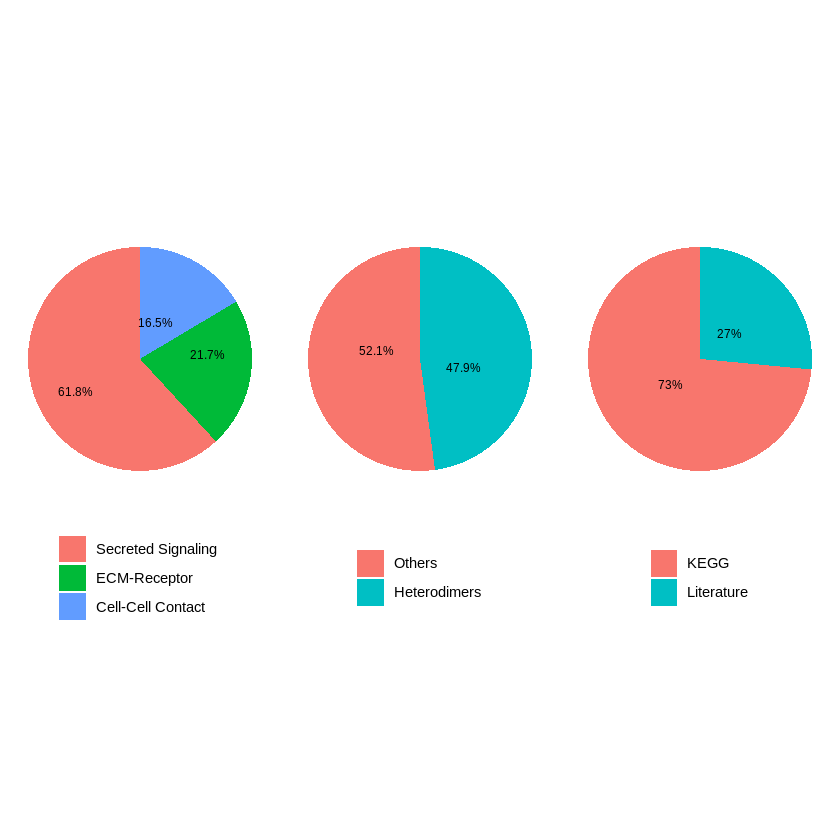

In [27]:
showDatabaseCategory(CellChatDB)

In [29]:
dplyr::glimpse(CellChatDB$interaction) #show structure of  the database


Rows: 1,939
Columns: 11
$ interaction_name   <chr> "TGFB1_TGFBR1_TGFBR2", "TGFB2_TGFBR1_TGFBR2", "TGFB…
$ pathway_name       <chr> "TGFb", "TGFb", "TGFb", "TGFb", "TGFb", "TGFb", "TG…
$ ligand             <chr> "TGFB1", "TGFB2", "TGFB3", "TGFB1", "TGFB1", "TGFB2…
$ receptor           <chr> "TGFbR1_R2", "TGFbR1_R2", "TGFbR1_R2", "ACVR1B_TGFb…
$ agonist            <chr> "TGFb agonist", "TGFb agonist", "TGFb agonist", "TG…
$ antagonist         <chr> "TGFb antagonist", "TGFb antagonist", "TGFb antagon…
$ co_A_receptor      <chr> "", "", "", "", "", "", "", "", "", "", "", "", "",…
$ co_I_receptor      <chr> "TGFb inhibition receptor", "TGFb inhibition recept…
$ evidence           <chr> "KEGG: hsa04350", "KEGG: hsa04350", "KEGG: hsa04350…
$ annotation         <chr> "Secreted Signaling", "Secreted Signaling", "Secret…
$ interaction_name_2 <chr> "TGFB1 - (TGFBR1+TGFBR2)", "TGFB2 - (TGFBR1+TGFBR2)…


In [31]:
# use a subset of CellChatDB for cell-cell communication analysis
#CellChatDB.use <- subsetDB(CellChatDB, search = "Secreted Signaling") # use Secreted Signaling

In [32]:
# use all CellChatDB for cell-cell communication analysis
CellChatDB.use <- CellChatDB # simply use the default CellChatDB

In [33]:
# set the used database in the object
cellchat@DB <- CellChatDB.use

#Preprocessing the expression data for cell-cell communication analysis

In [34]:
# subset the expression data of signaling genes for saving computation cost
cellchat <- subsetData(cellchat)

In [36]:
future::plan("multicore", workers = 4) # do parallel

In [39]:
cellchat <- identifyOverExpressedGenes(cellchat)
cellchat <- identifyOverExpressedInteractions(cellchat)


In [40]:
cellchat_PPI <- projectData(cellchat, PPI.human)

#Inference of cell-cell communication network

#Compute the communication probability and infer cellular communication network

In [41]:
cellchat_compute <- computeCommunProb(cellchat)

triMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on sc/snRNA-seq data <<< [2023-10-04 13:33:18]"
[1] ">>> CellChat inference is done. Parameter values are stored in `object@options$parameter` <<< [2023-10-04 13:45:45]"


In [42]:
# Filter out the cell-cell communication if there are only few number of cells in certain cell groups
cellchat_filter <- filterCommunication(cellchat_compute, min.cells = 10)


# Extract the inferred cellular communication network as a data frame

#Infer the cell-cell communication at a signaling pathway level


In [43]:
cellchat_infer <- computeCommunProbPathway(cellchat_filter)


#Calculate the aggregated cell-cell communication network


In [44]:
cellchat_cal <- aggregateNet(cellchat_infer)


In [47]:
cellchat_cal

An object of class CellChat created from a single dataset 
 22114 genes.
 29319 cells. 
CellChat analysis of single cell RNA-seq data! 

In [49]:
groupSize <- as.numeric(table(cellchat_cal@idents))
par(mfrow = c(1,2), xpd=TRUE)

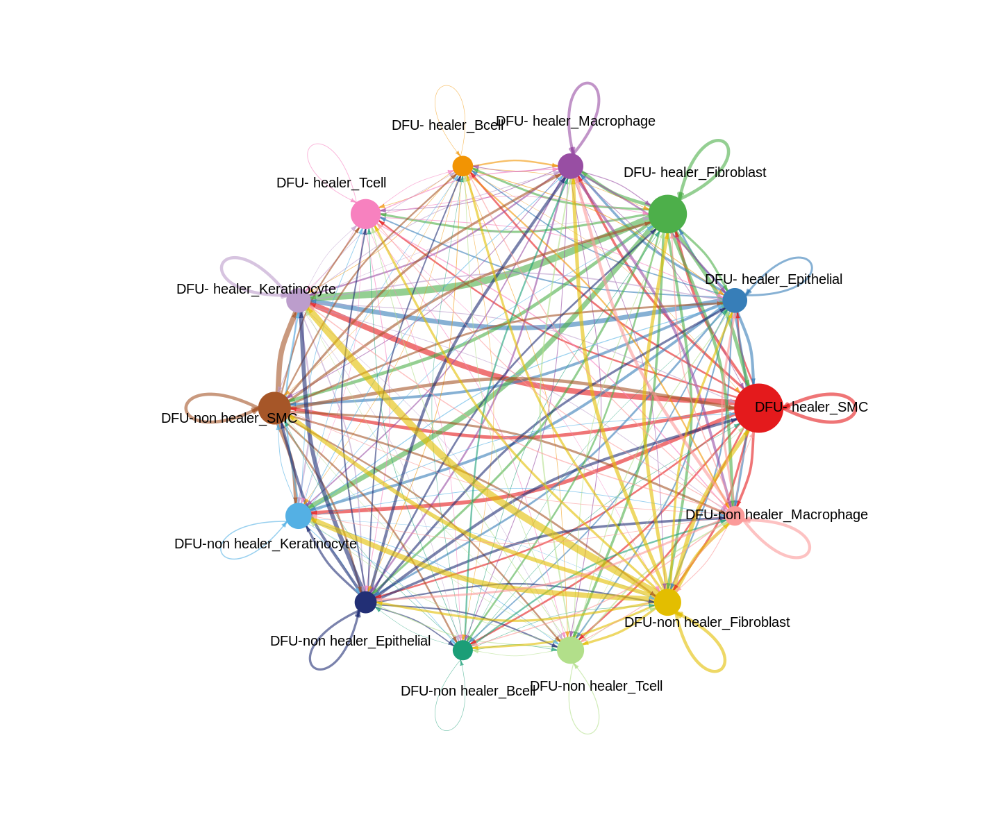

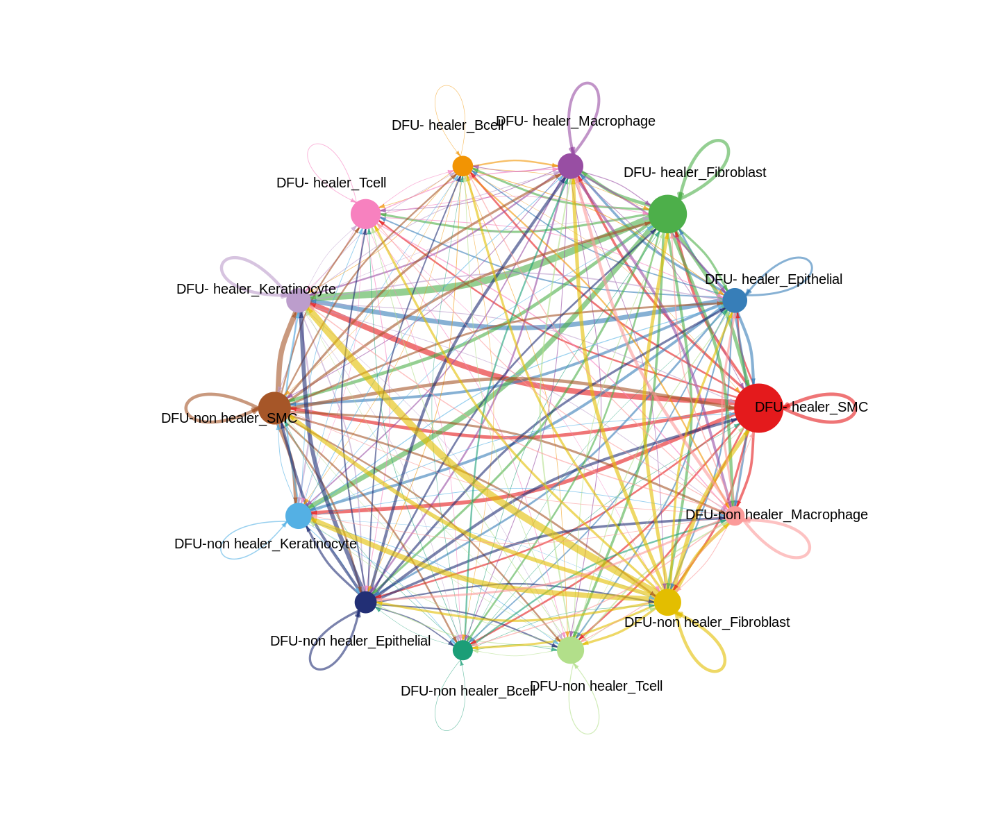

In [55]:
options(  repr.plot.width = 12, repr.plot.height = 10)
netVisual_circle(cellchat_cal@net$count, vertex.weight = groupSize, weight.scale = T, label.edge= F, title.name = "Number of interactions")


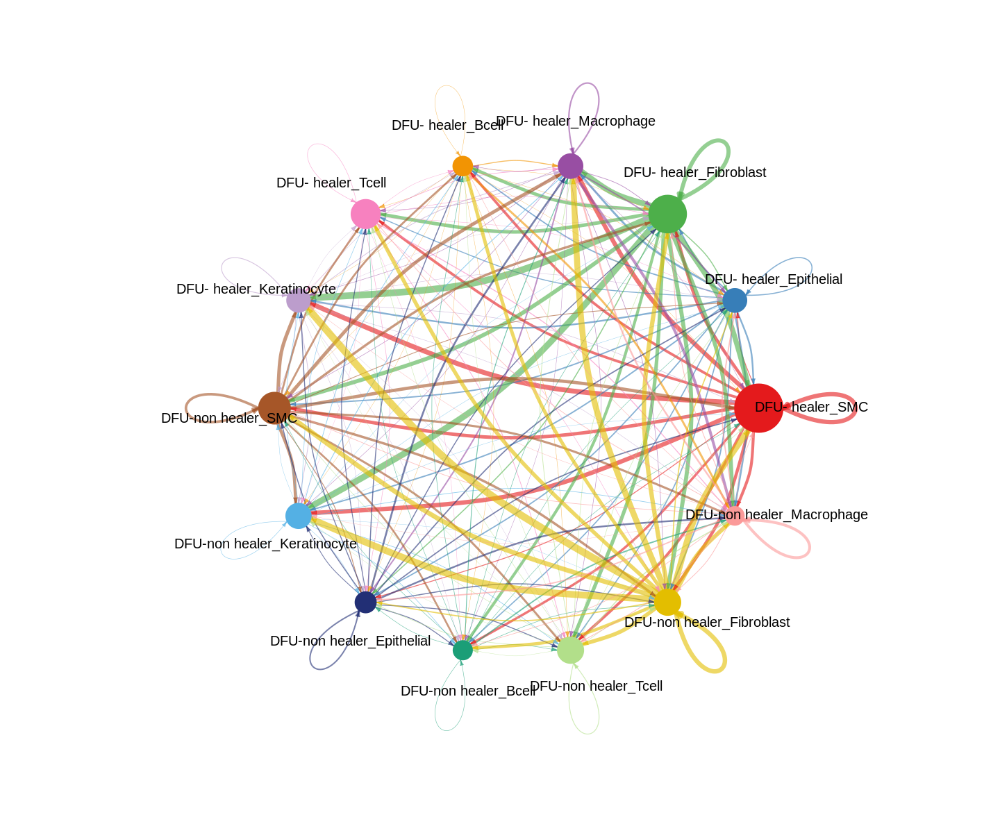

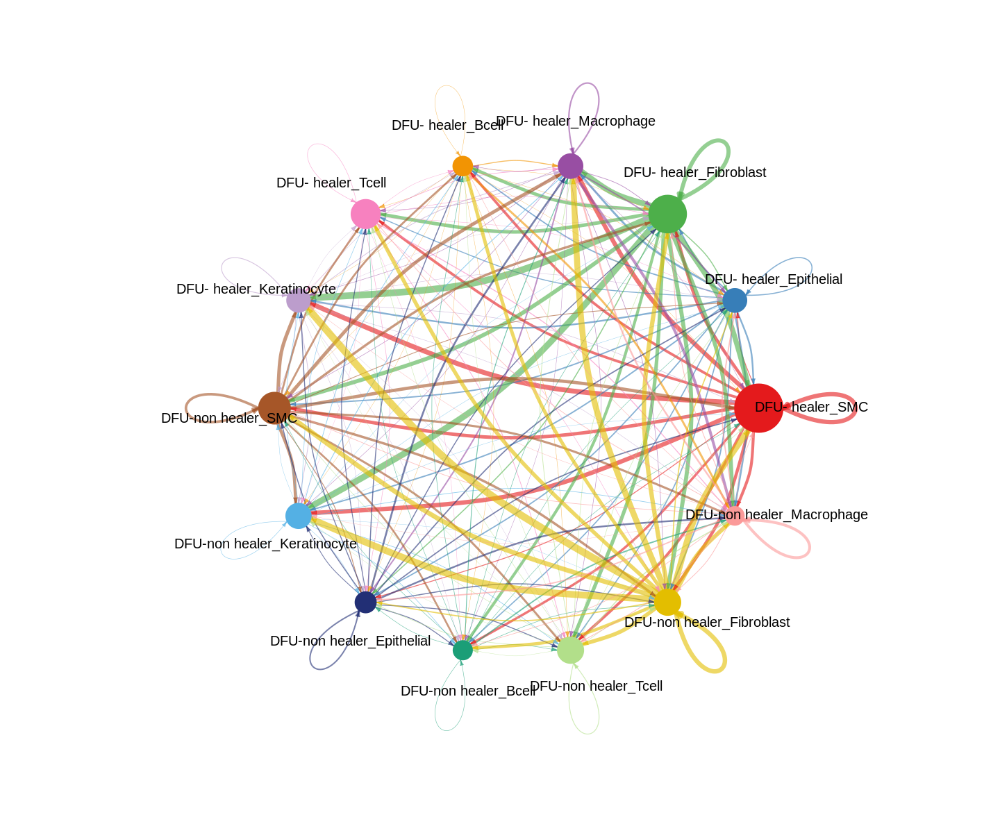

In [54]:
options(  repr.plot.width = 12, repr.plot.height = 10)
netVisual_circle(cellchat_cal@net$weight, vertex.weight = groupSize, weight.scale = T, label.edge= F, title.name = "Interaction weights/strength")

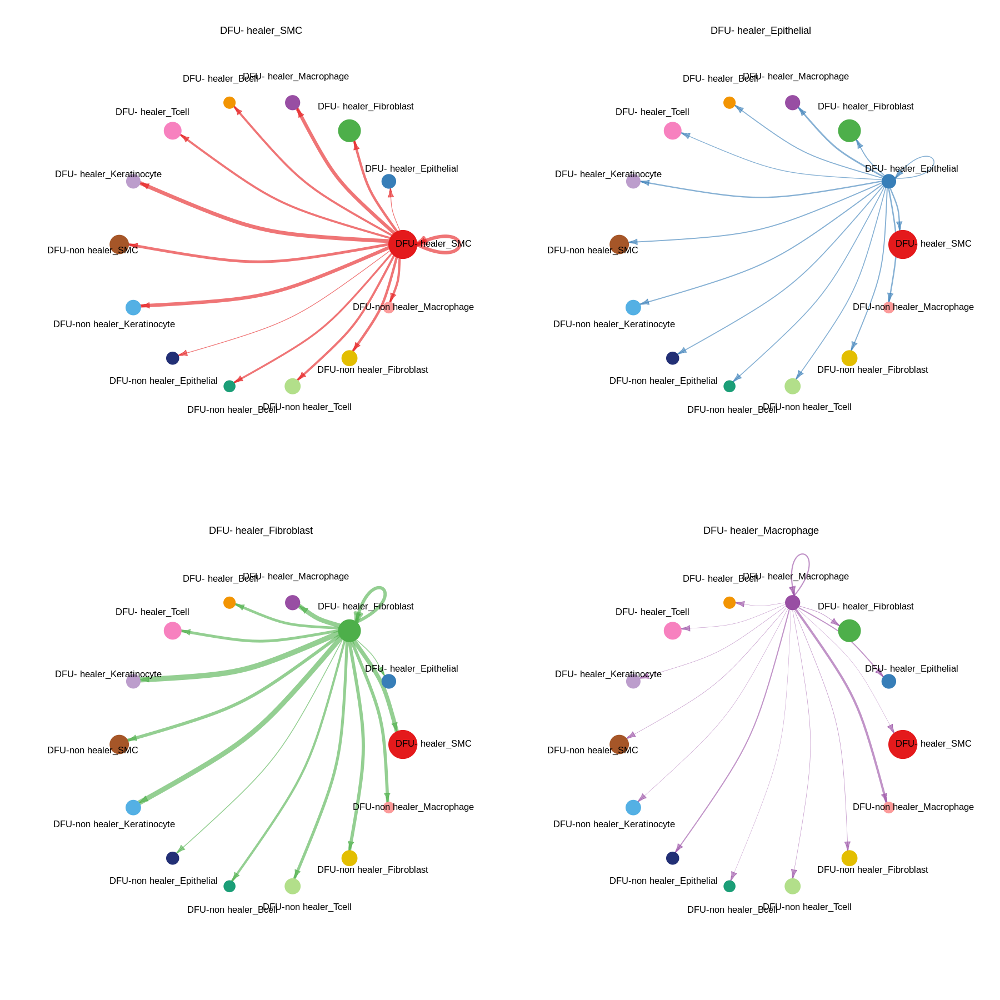

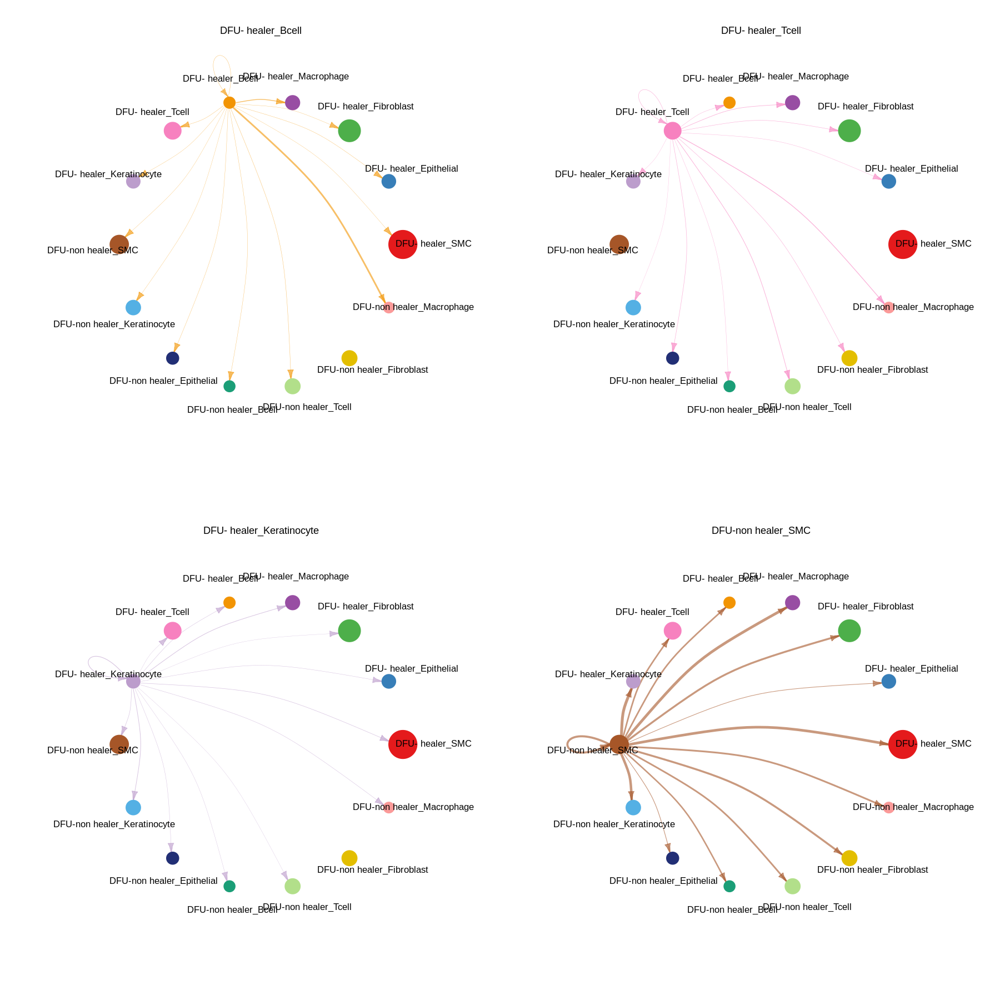

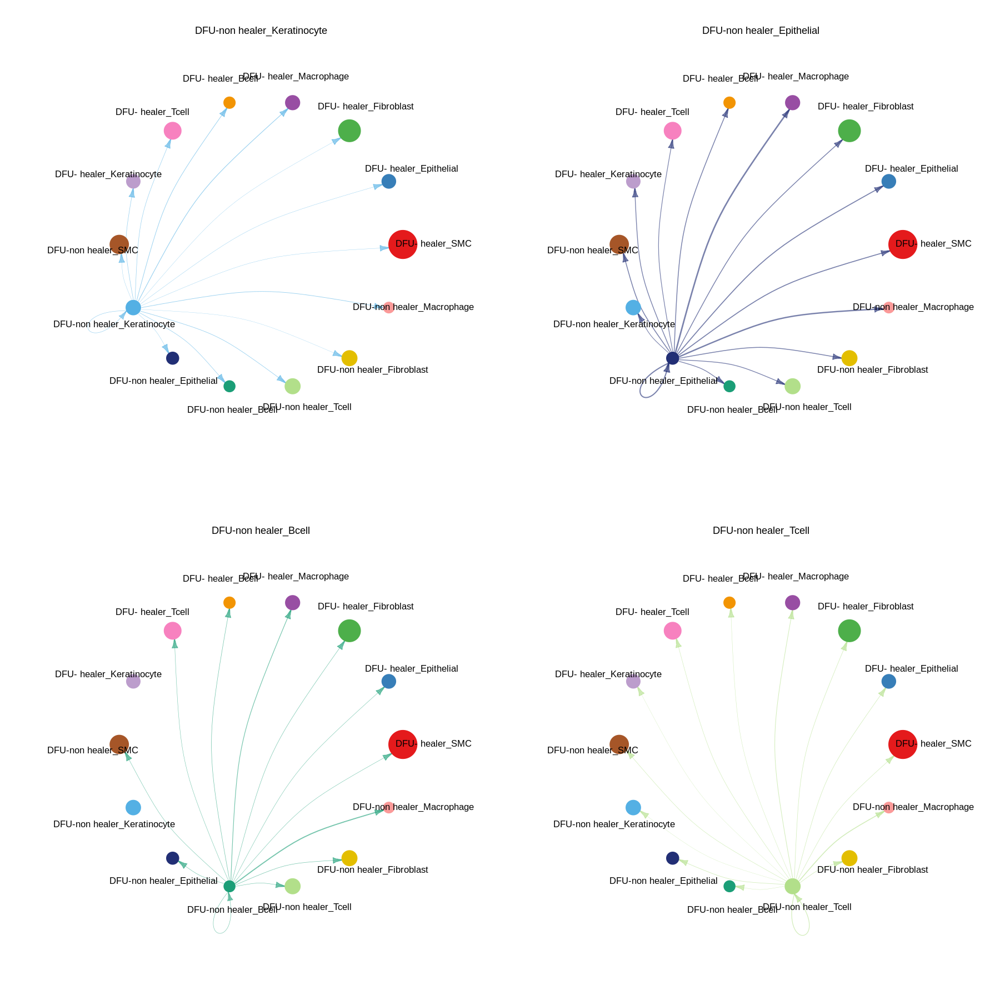

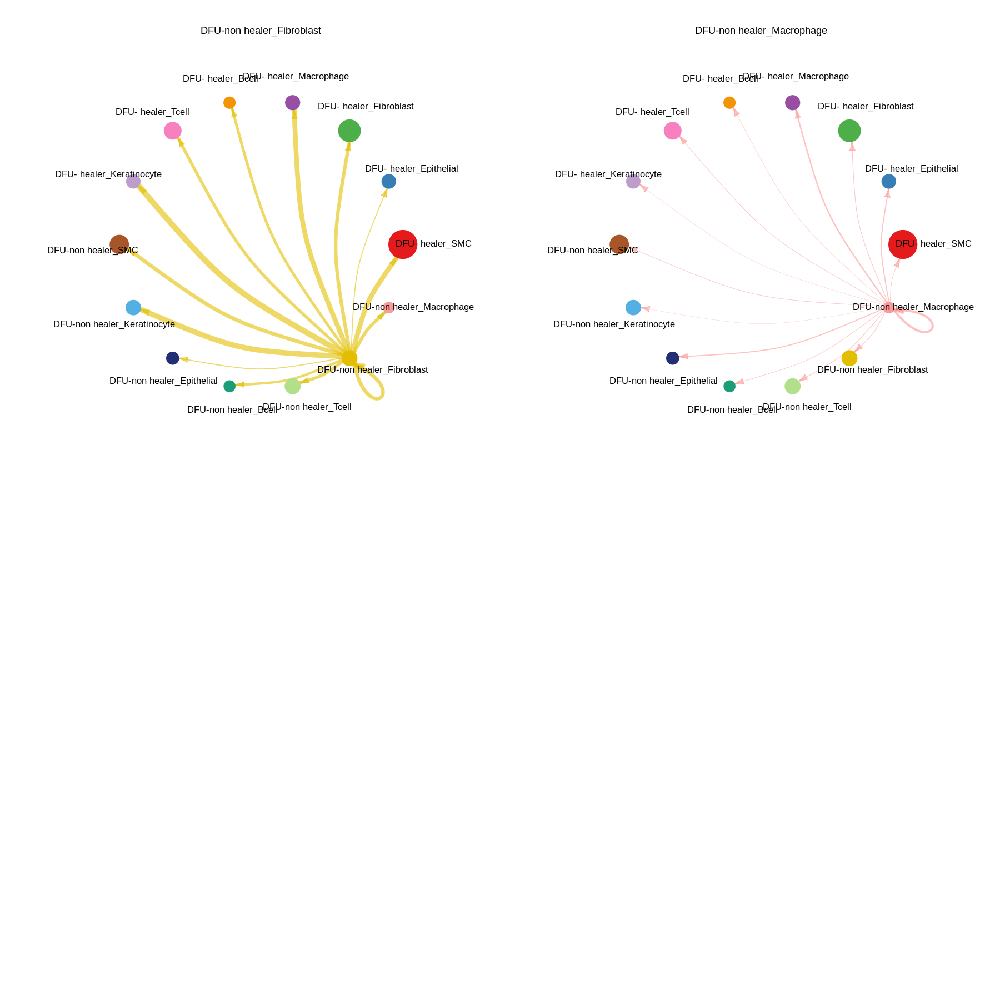

In [67]:
options(  repr.plot.width = 15, repr.plot.height = 15)
mat <- cellchat_cal@net$weight
par(mfrow = c(2,2), xpd=TRUE)
for (i in 1:nrow(mat)) {
  mat2 <- matrix(0, nrow = nrow(mat), ncol = ncol(mat), dimnames = dimnames(mat))
  mat2[i, ] <- mat[i, ]
  netVisual_circle(mat2, vertex.weight = groupSize, weight.scale = T, edge.weight.max = max(mat), title.name = rownames(mat)[i])
}

# Visualization of cell-cell communication network

#Visualize each signaling pathway using Hierarchy plot, Circle plot or Chord diagram

In [68]:
pathways.show <- c("CXCL") 

In [69]:
vertex.receiver = seq(1,4)

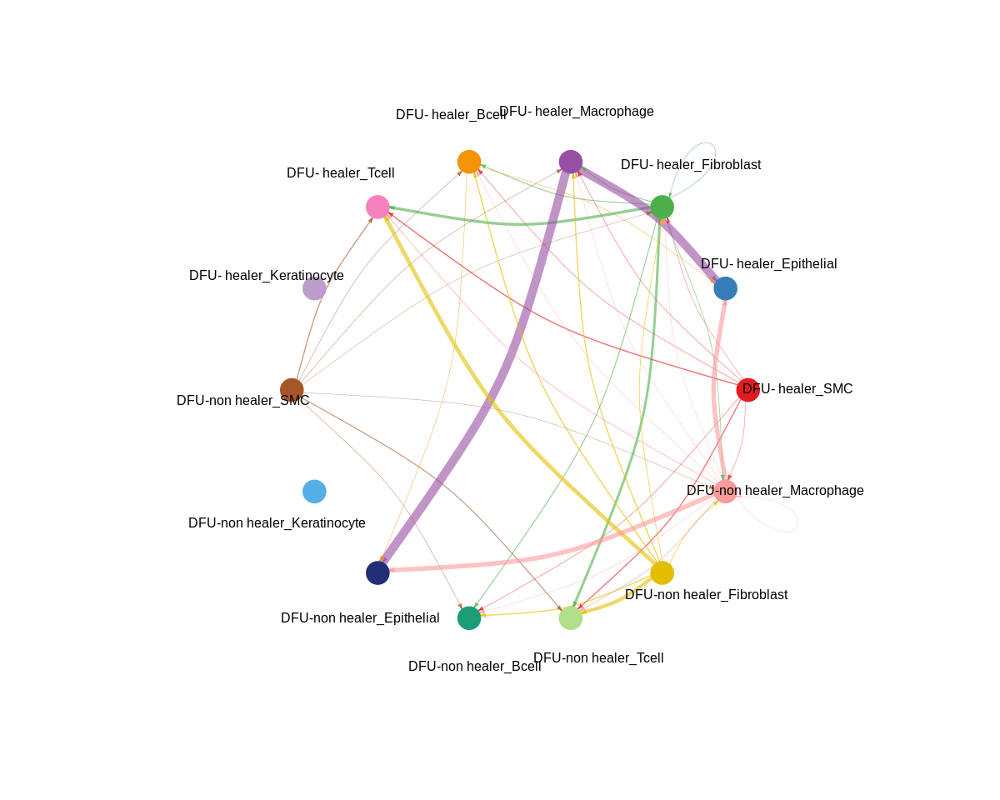

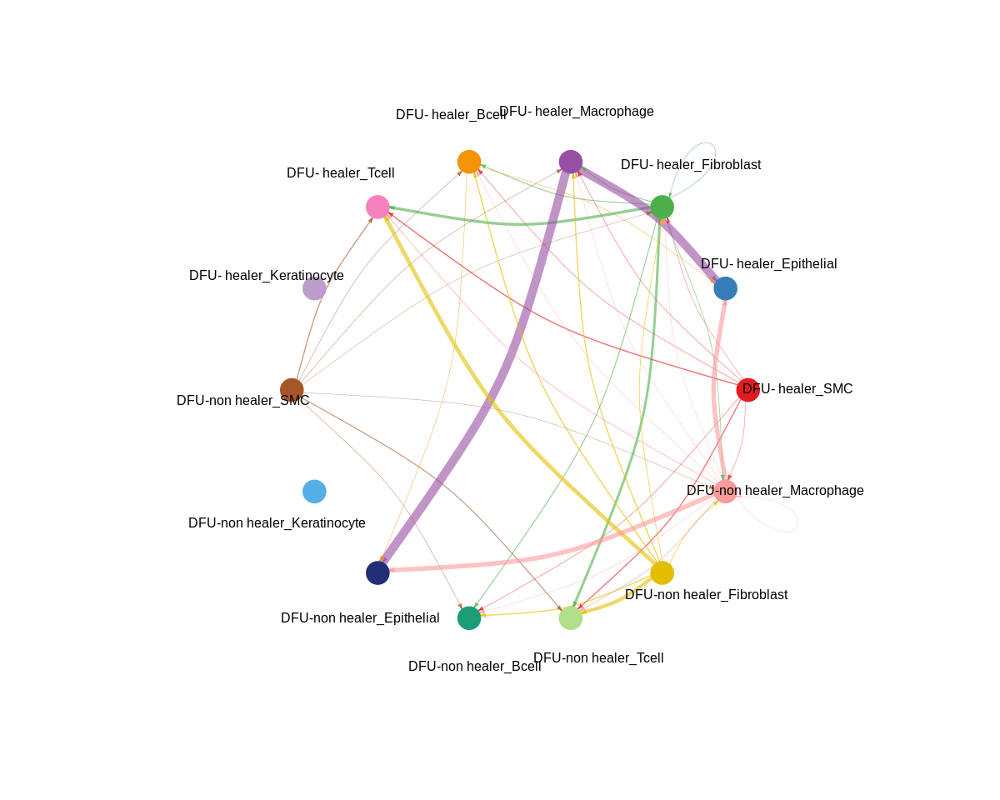

In [71]:
options(  repr.plot.width = 10, repr.plot.height = 8)
netVisual_aggregate(cellchat_cal, signaling = pathways.show,  vertex.receiver = vertex.receiver)

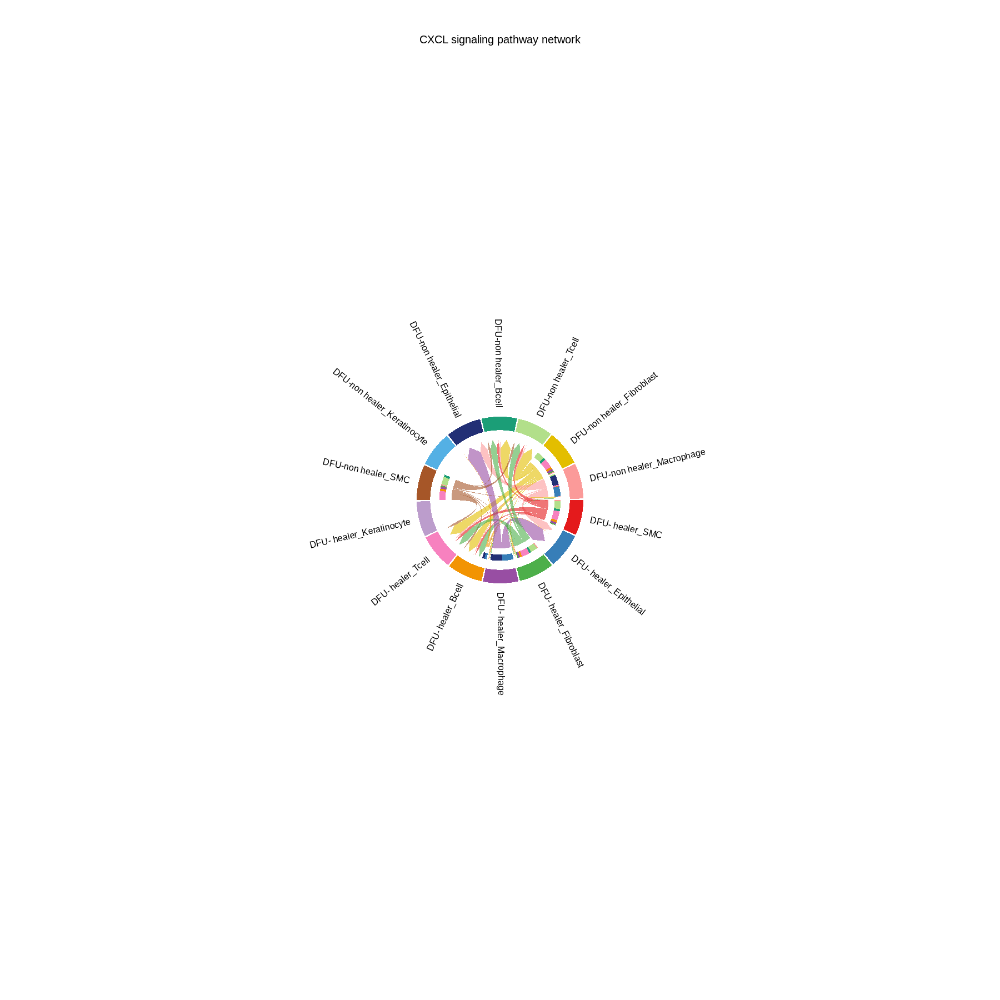

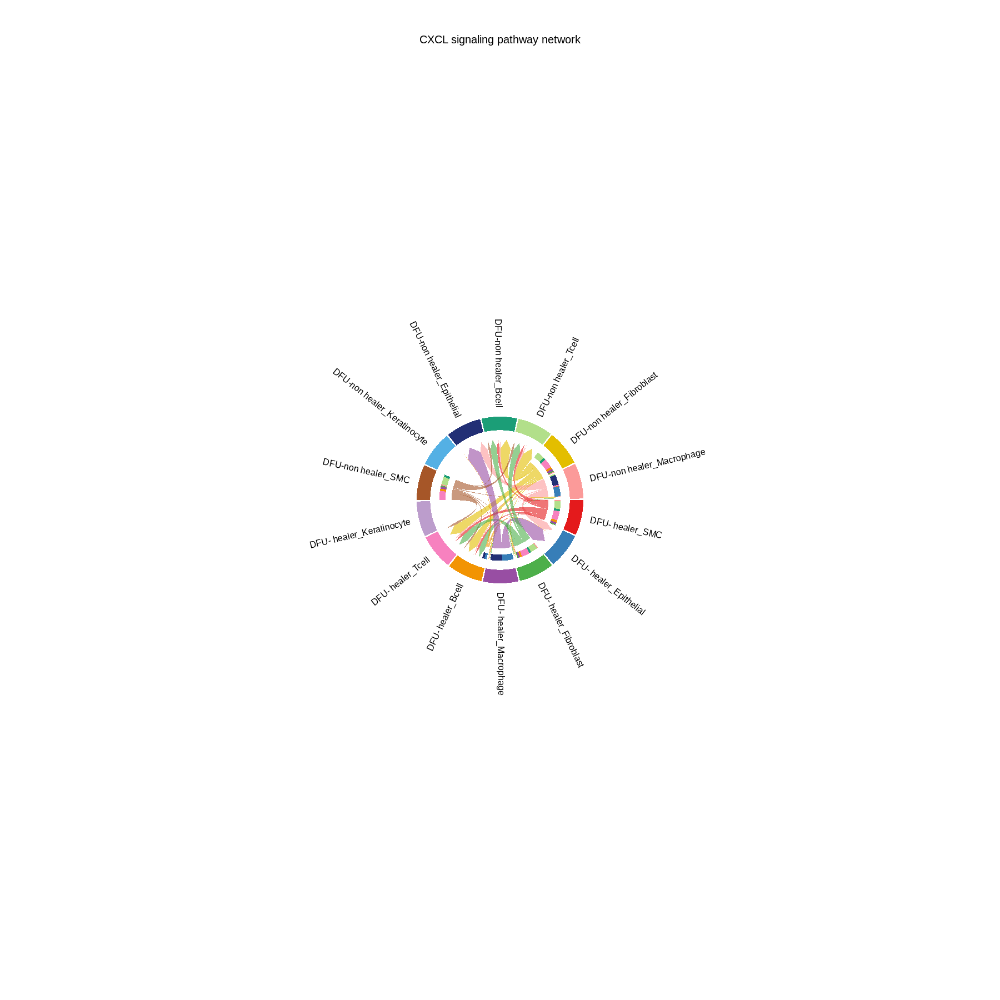

In [76]:
# Chord diagram
options(  repr.plot.width = 15, repr.plot.height = 15)
par(mfrow=c(1,1))
netVisual_aggregate(cellchat_cal, signaling = pathways.show, layout = "chord")

In [79]:
# Heatmap
par(mfrow=c(1,1))
netVisual_heatmap(cellchat_cal, signaling = pathways.show, color.heatmap = "Reds")


Do heatmap based on a single object 




ERROR: Error in file(con, "rb"): cannot open the connection


plot without title

In [80]:
print(pathways.show)

[1] "CXCL"


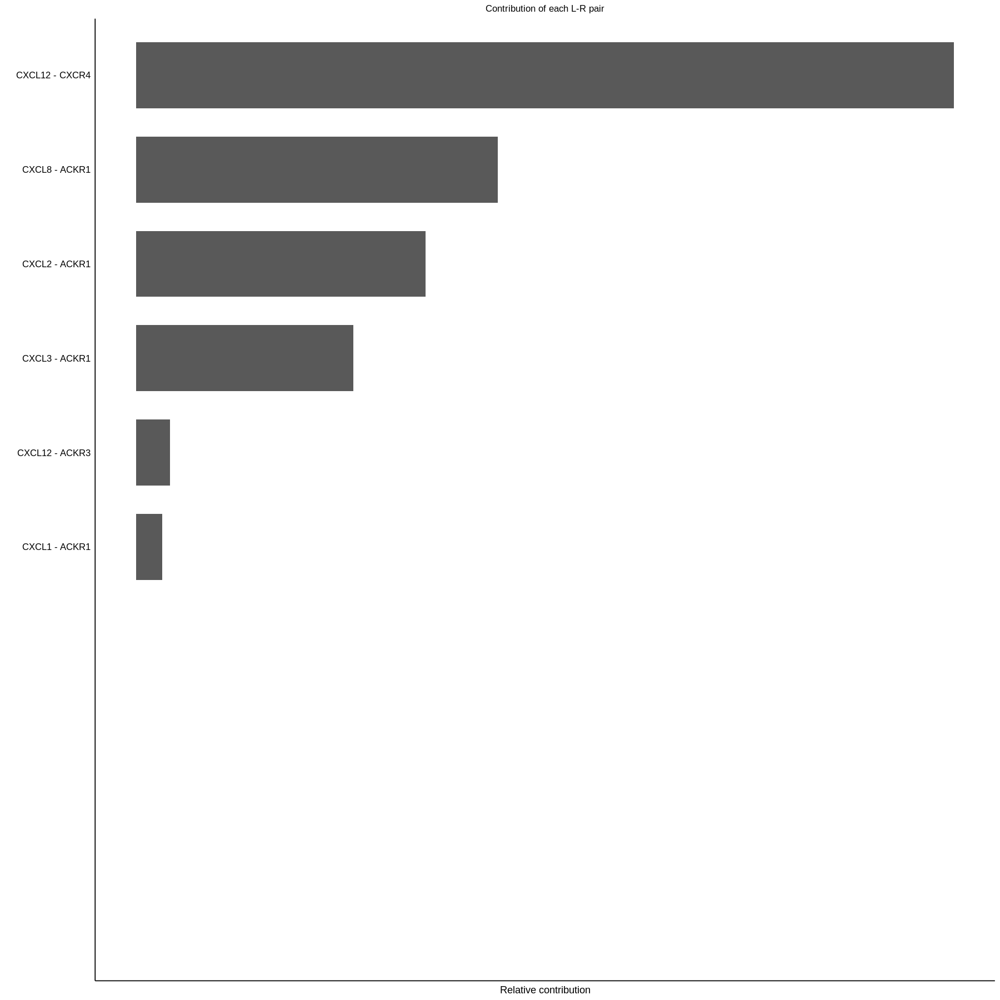

In [83]:
netAnalysis_contribution(cellchat_cal, signaling = pathways.show)


[[1]]


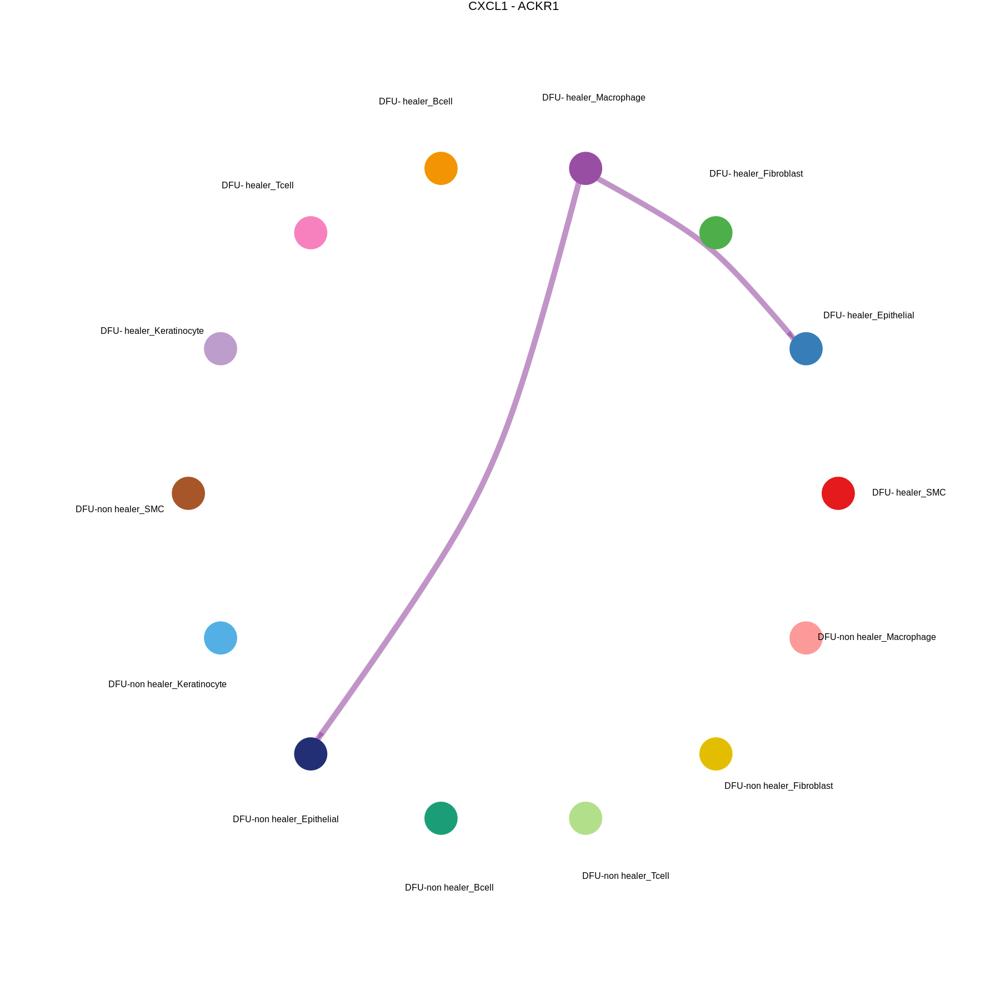

In [89]:
pairLR.CXCL <- extractEnrichedLR(cellchat_cal, signaling = pathways.show, geneLR.return = FALSE)
LR.show <- pairLR.CXCL[1,] # show one ligand-receptor pair
# Hierarchy plot
vertex.receiver = seq(1,4) # a numeric vector
netVisual_individual(cellchat_cal, signaling = pathways.show,  pairLR.use = LR.show, vertex.receiver = vertex.receiver)



[[1]]


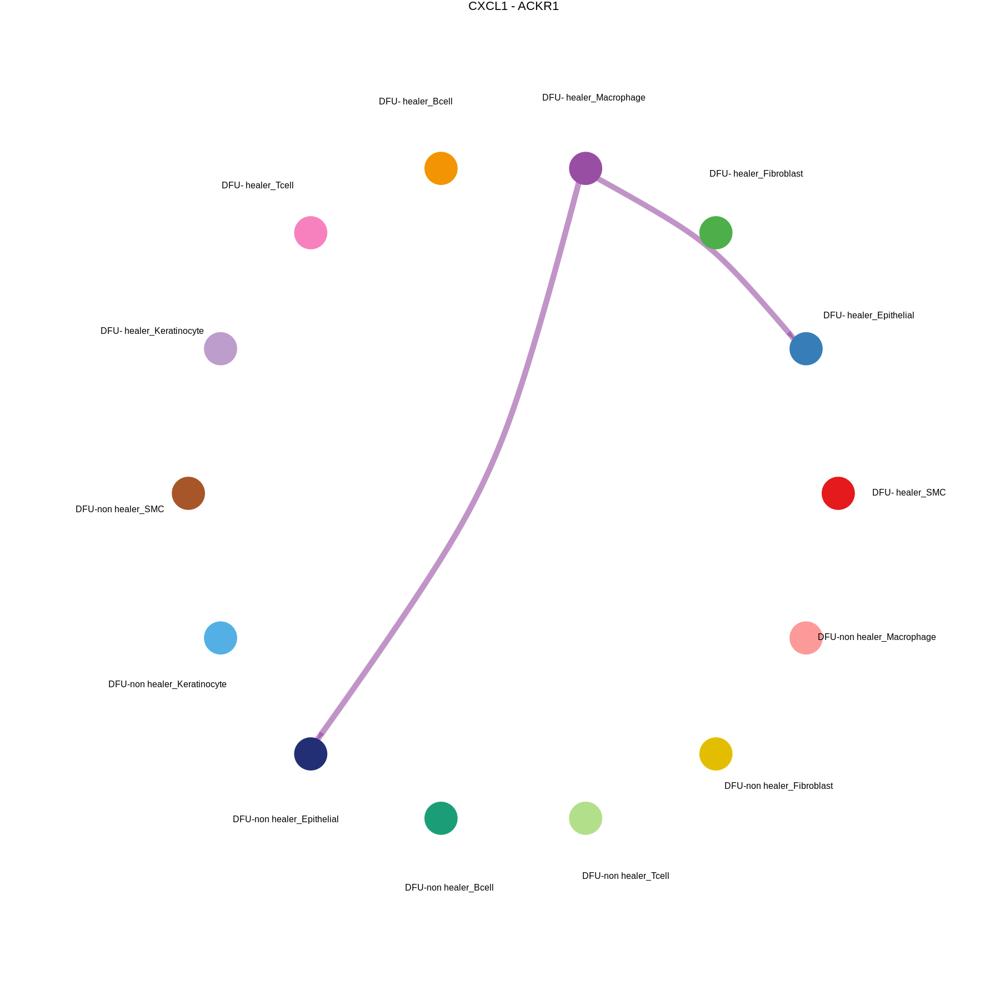

In [90]:

# Circle plot
netVisual_individual(cellchat_cal, signaling = pathways.show, pairLR.use = LR.show, layout = "circle")

#Saving

In [98]:
# Access all the signaling pathways showing significant communications
pathways.show.all <- cellchat_cal@netP$pathways
# check the order of cell identity to set suitable vertex.receiver
levels(cellchat_cal@idents)
vertex.receiver = seq(1,4)
for (i in 1:length(pathways.show.all)) {
  # Visualize communication network associated with both signaling pathway and individual L-R pairs
  netVisual(cellchat_cal, signaling = pathways.show.all[i], vertex.receiver = vertex.receiver, layout = "hierarchy")
  # Compute and visualize the contribution of each ligand-receptor pair to the overall signaling pathway
  gg <- netAnalysis_contribution(cellchat_cal, signaling = pathways.show.all[i])
  ggsave(filename=paste0(pathways.show.all[i], "L-R_contribution.pdf", plot=gg, width = 3, height = 2, units = 'in', dpi = 300))
}

[1] "DFU- healer_SMC"             "DFU- healer_Epithelial"     
 [3] "DFU- healer_Fibroblast"      "DFU- healer_Macrophage"     
 [5] "DFU- healer_Bcell"           "DFU- healer_Tcell"          
 [7] "DFU- healer_Keratinocyte"    "DFU-non healer_SMC"         
 [9] "DFU-non healer_Keratinocyte" "DFU-non healer_Epithelial"  
[11] "DFU-non healer_Bcell"        "DFU-non healer_Tcell"       
[13] "DFU-non healer_Fibroblast"   "DFU-non healer_Macrophage"

ERROR: Error in grDevices::png(paste0(signaling.name, "_hierarchy_individual.png"), : unable to start device 'png'


In [97]:
install.packages("png")
library(png)


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



# Visualize cell-cell communication mediated by multiple ligand-receptors or signaling pathways

Comparing communications on a single object 




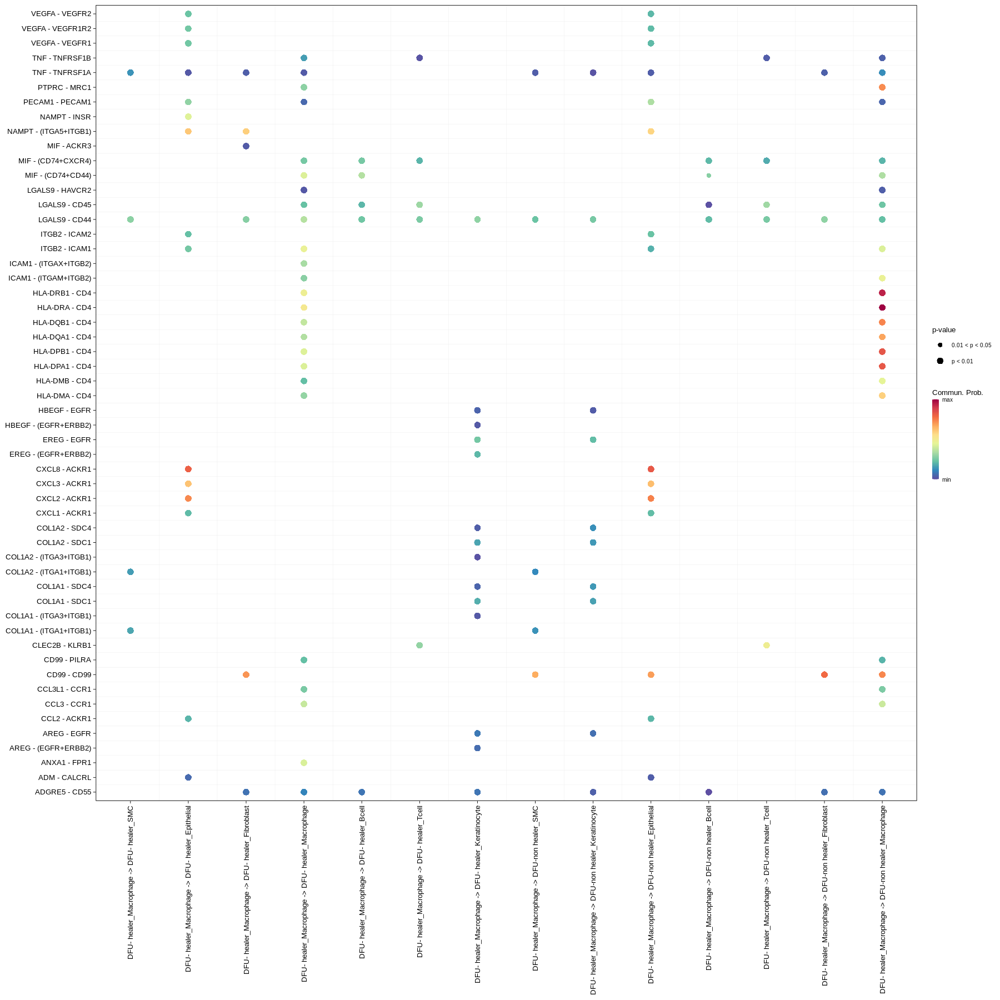

In [104]:
# show all the significant interactions (L-R pairs) from some cell groups (defined by 'sources.use') to other cell groups (defined by 'targets.use')
netVisual_bubble(cellchat_cal, sources.use = 4, targets.use = c(1:14), remove.isolate = FALSE)
#> Comparing communications on a single object

In [105]:
p1 <- netVisual_bubble(cellchat_cal, sources.use = 4, targets.use = c(1:14), remove.isolate = FALSE)


Comparing communications on a single object 




In [108]:
ggsave("/data2/ZenNa/DFU_Project/Result/humancellcellinteraction.png", p1,  width = 10, height = 15, units = "in")


Comparing communications on a single object 




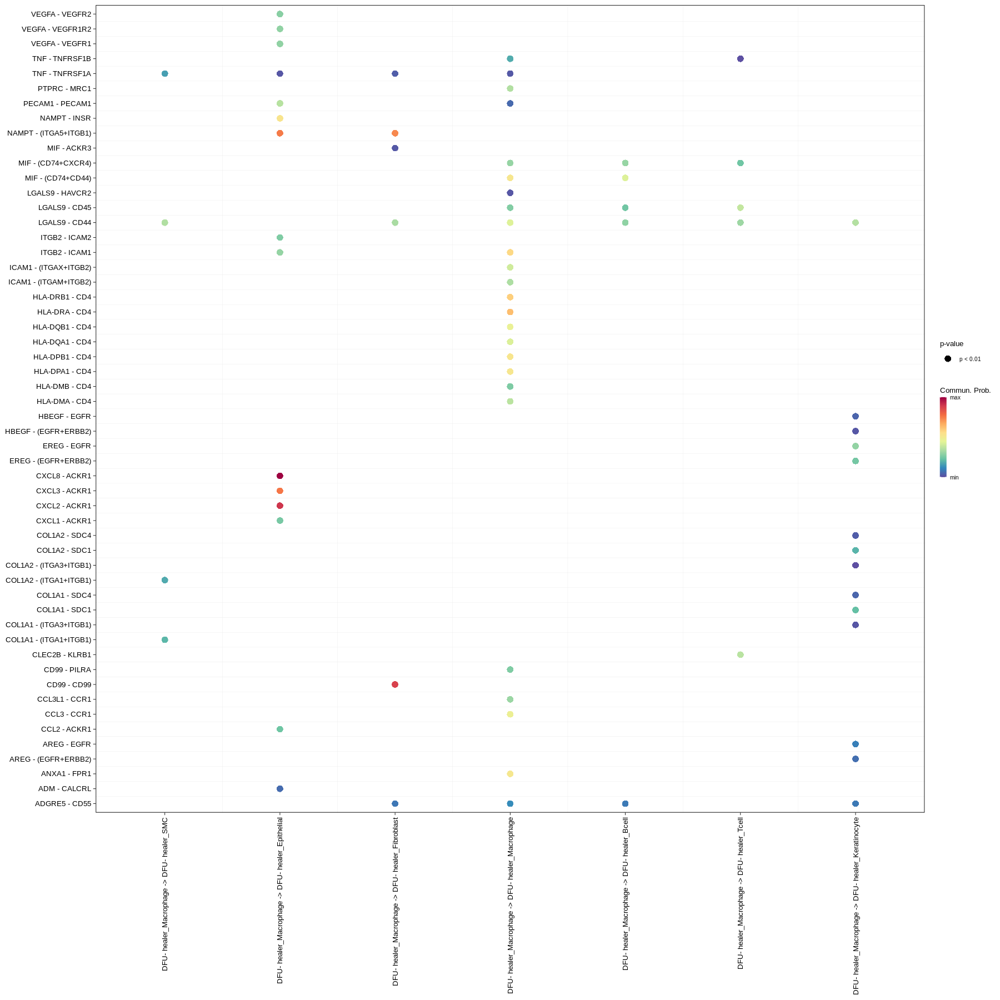

In [124]:
netVisual_bubble(cellchat_cal, sources.use = 4, targets.use = c(1:7),remove.isolate = FALSE)


Comparing communications on a single object 




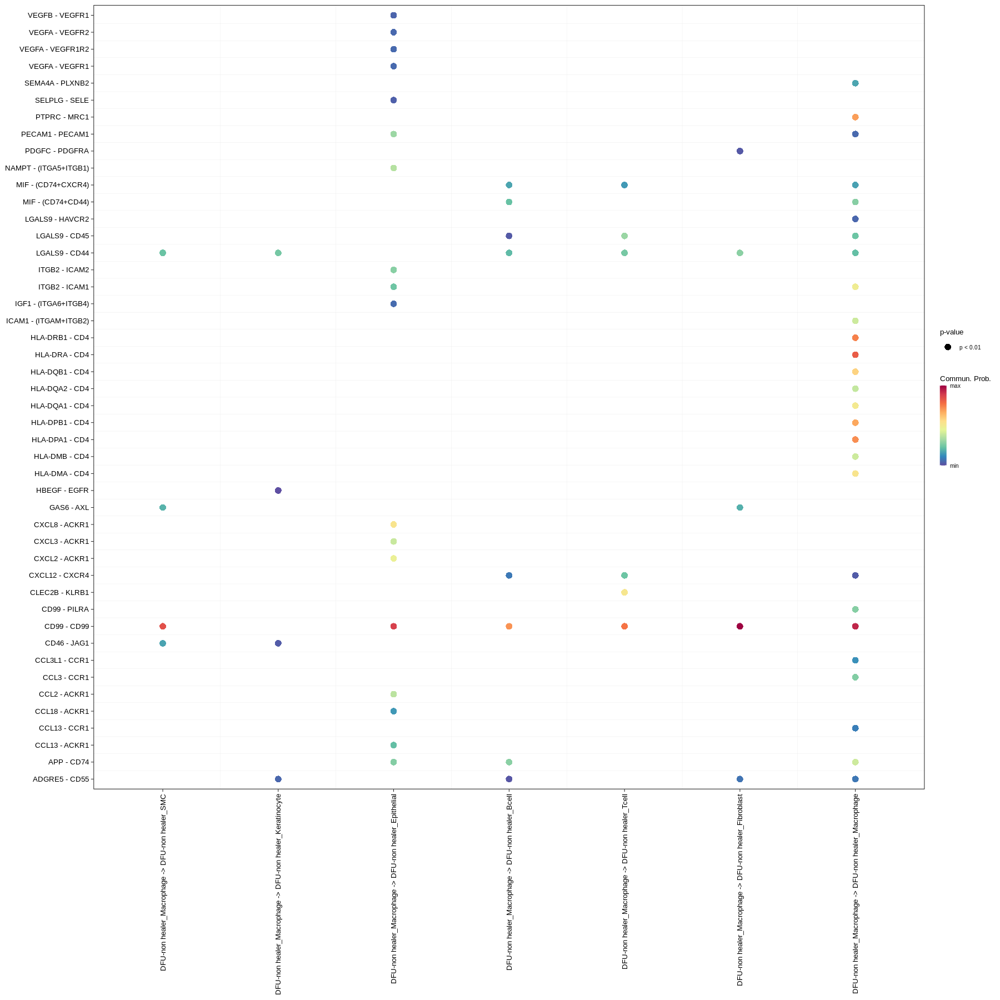

In [123]:
netVisual_bubble(cellchat_cal, sources.use = 14, targets.use = c(8:14), remove.isolate = FALSE)


Comparing communications on a single object 




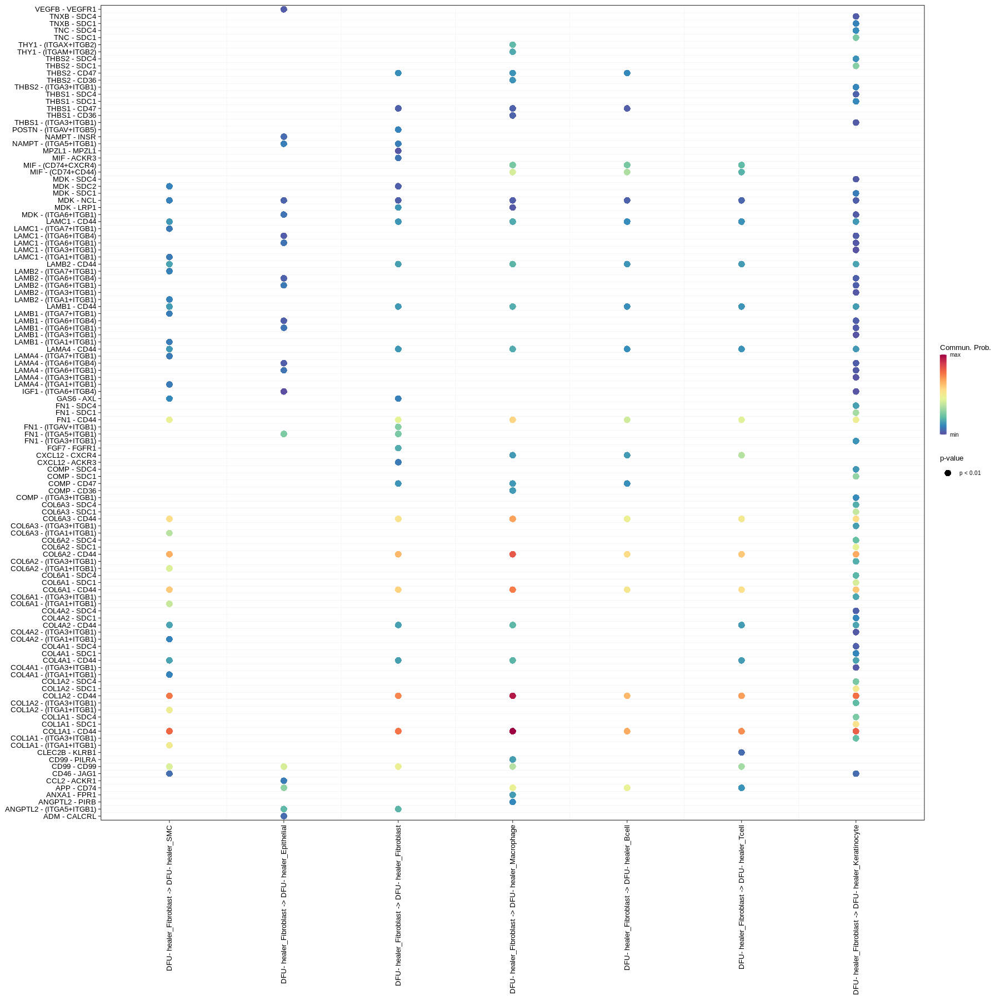

In [137]:
netVisual_bubble(cellchat_cal, sources.use = 3, targets.use = c(1:7), remove.isolate = FALSE)


In [125]:
p2 <-netVisual_bubble(cellchat_cal, sources.use = 4, targets.use = c(1:7),remove.isolate = FALSE)
p3 <- netVisual_bubble(cellchat_cal, sources.use = 14, targets.use = c(8:14), remove.isolate = FALSE)
ggsave("/data2/ZenNa/DFU_Project/Result/human_healer_Maccell_interaction.png", p2,  width = 10, height = 15, units = "in")
ggsave("/data2/ZenNa/DFU_Project/Result/human_nonhealer_Maccellinteraction.png", p3,  width = 10, height = 15, units = "in")



Comparing communications on a single object 


Comparing communications on a single object 




In [131]:
library(igraph)

In [138]:
p4 <- netVisual_bubble(cellchat_cal, sources.use = 3, targets.use = c(1:7), remove.isolate = FALSE)
ggsave("/data2/ZenNa/DFU_Project/Result/human_healer_Fibrocell_interaction.png", p4,  width = 10, height = 15, units = "in")

Comparing communications on a single object 




Comparing communications on a single object 




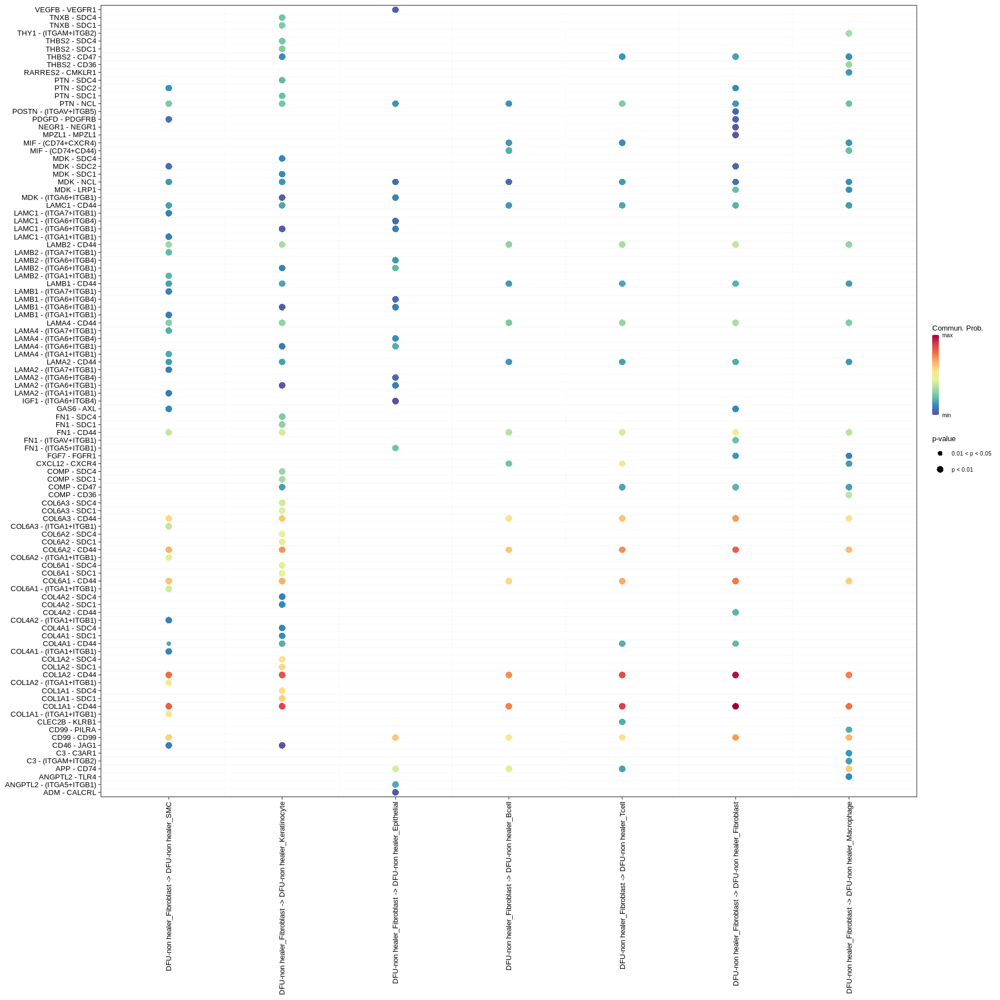

In [142]:

p5 <- netVisual_bubble(cellchat_cal, sources.use = 13, targets.use = c(8:14), remove.isolate = FALSE)
p5
ggsave("/data2/ZenNa/DFU_Project/Result/human_nonhealer_Fibrocell_interaction.png", p5,  width = 10, height = 15, units = "in")


# Plot the signaling gene expression distribution using violin/dot plot

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


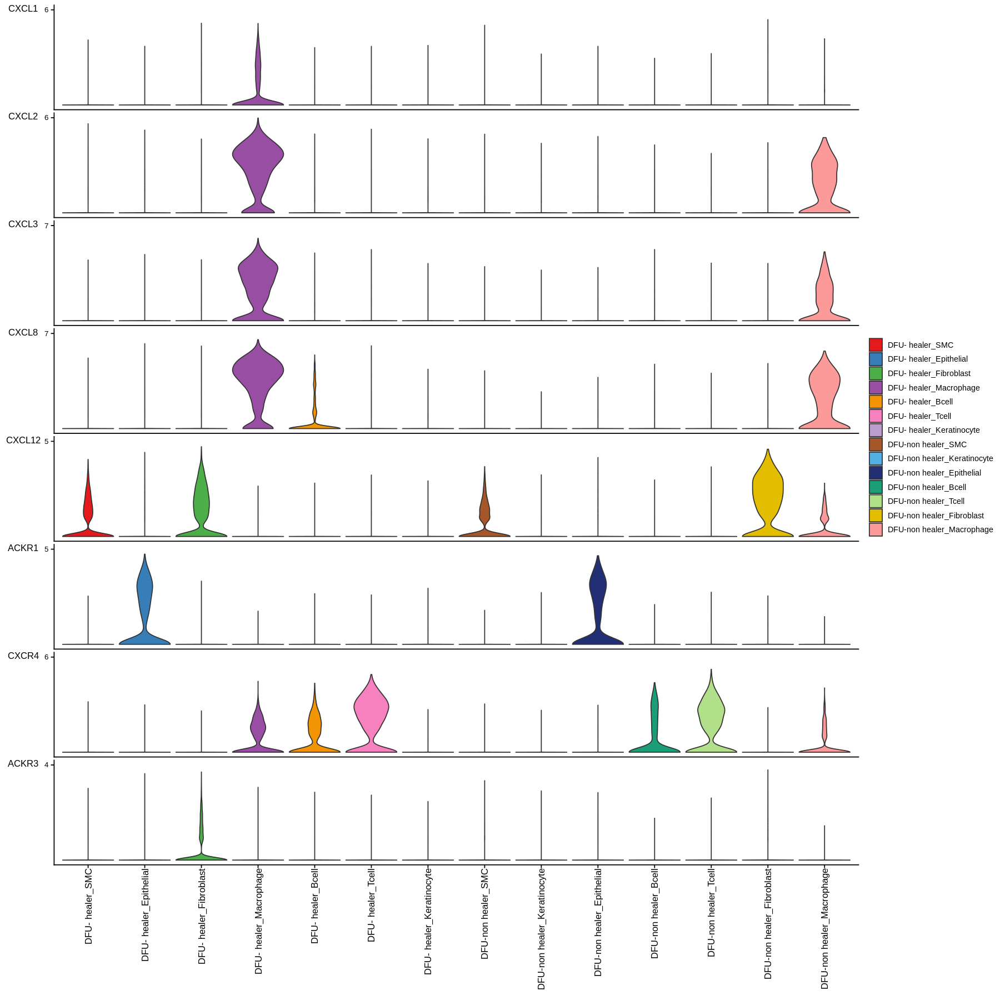

In [146]:
plotGeneExpression(cellchat_cal, signaling = "CXCL")


Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for 

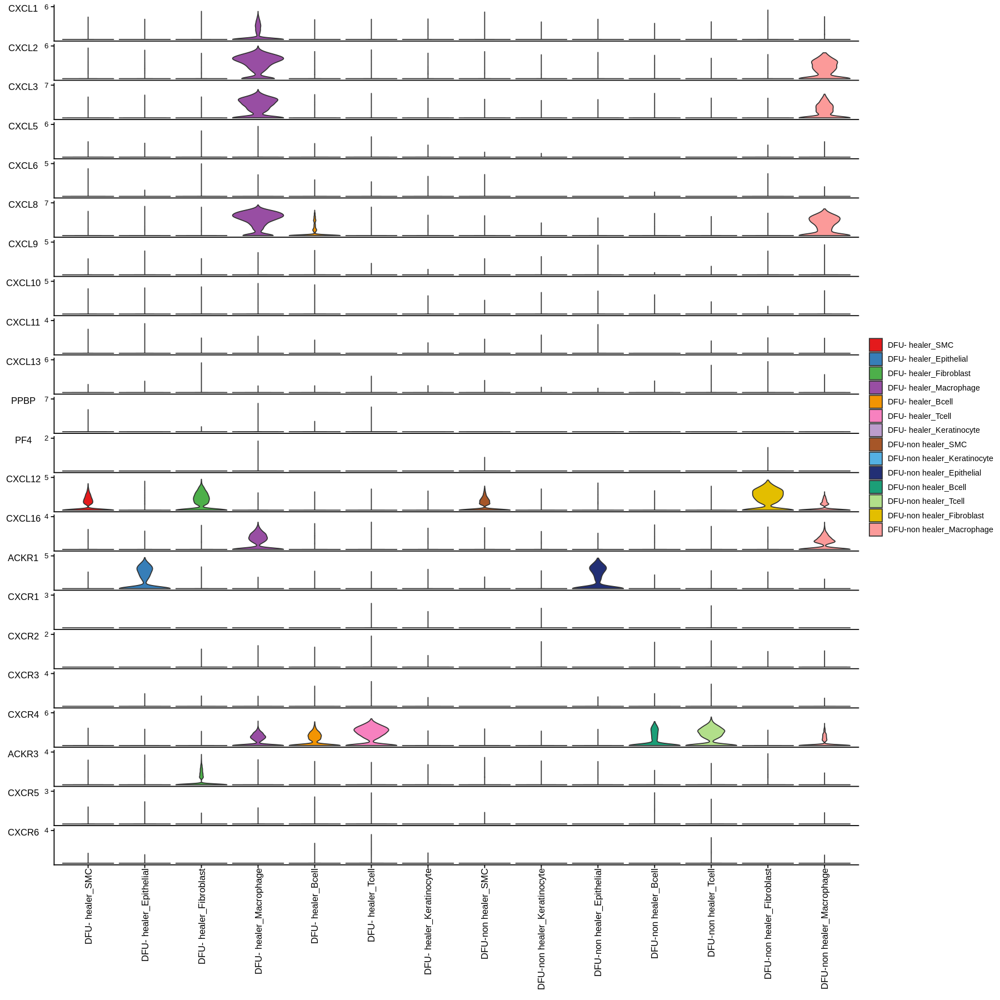

In [144]:
plotGeneExpression(cellchat_cal, signaling = "CXCL", enriched.only = FALSE)


#  Systems analysis of cell-cell communication network

#Compute and visualize the network centrality scores


In [148]:
cellchat_net <- netAnalysis_computeCentrality(cellchat_cal, slot.name = "netP")

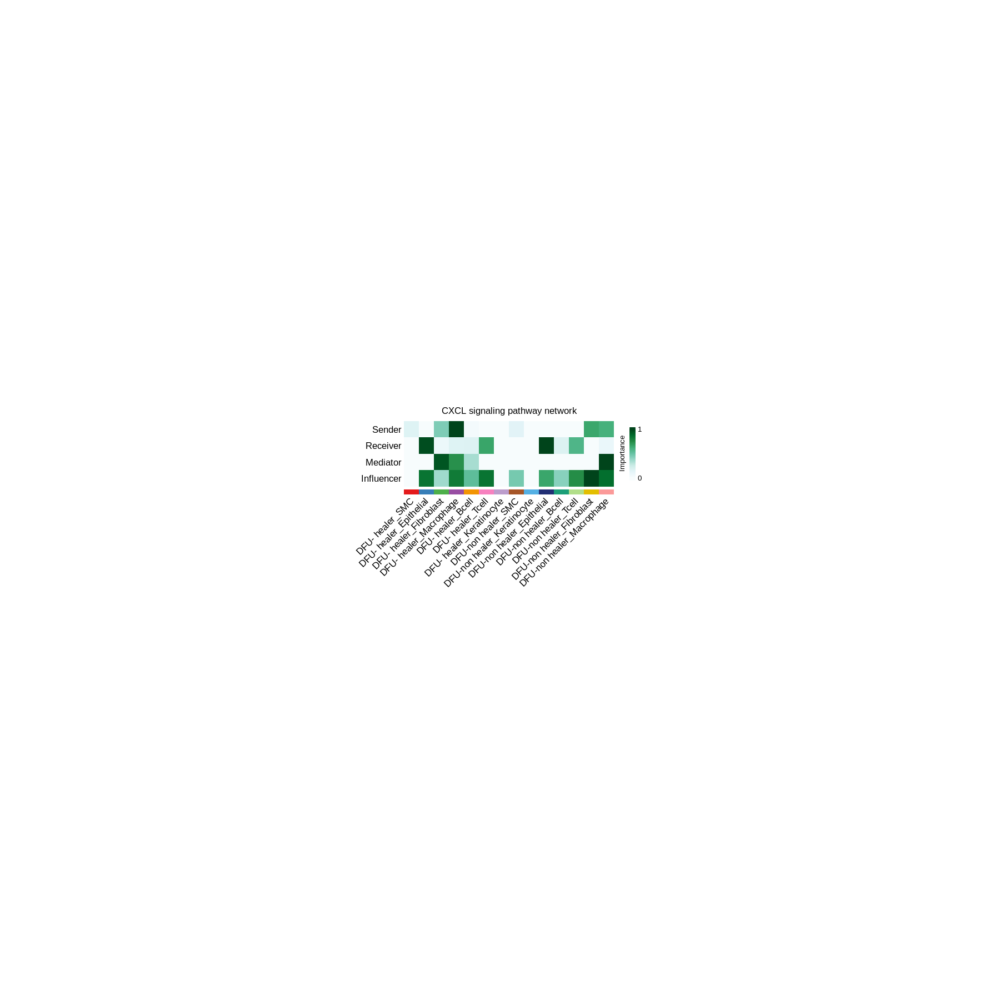

In [149]:
netAnalysis_signalingRole_network(cellchat_net, signaling = pathways.show, width = 8, height = 2.5, font.size = 10)


#Visualize the dominant senders (sources) and receivers (targets) in a 2D space


Signaling role analysis on the aggregated cell-cell communication network from all signaling pathways

Signaling role analysis on the cell-cell communication network from user's input



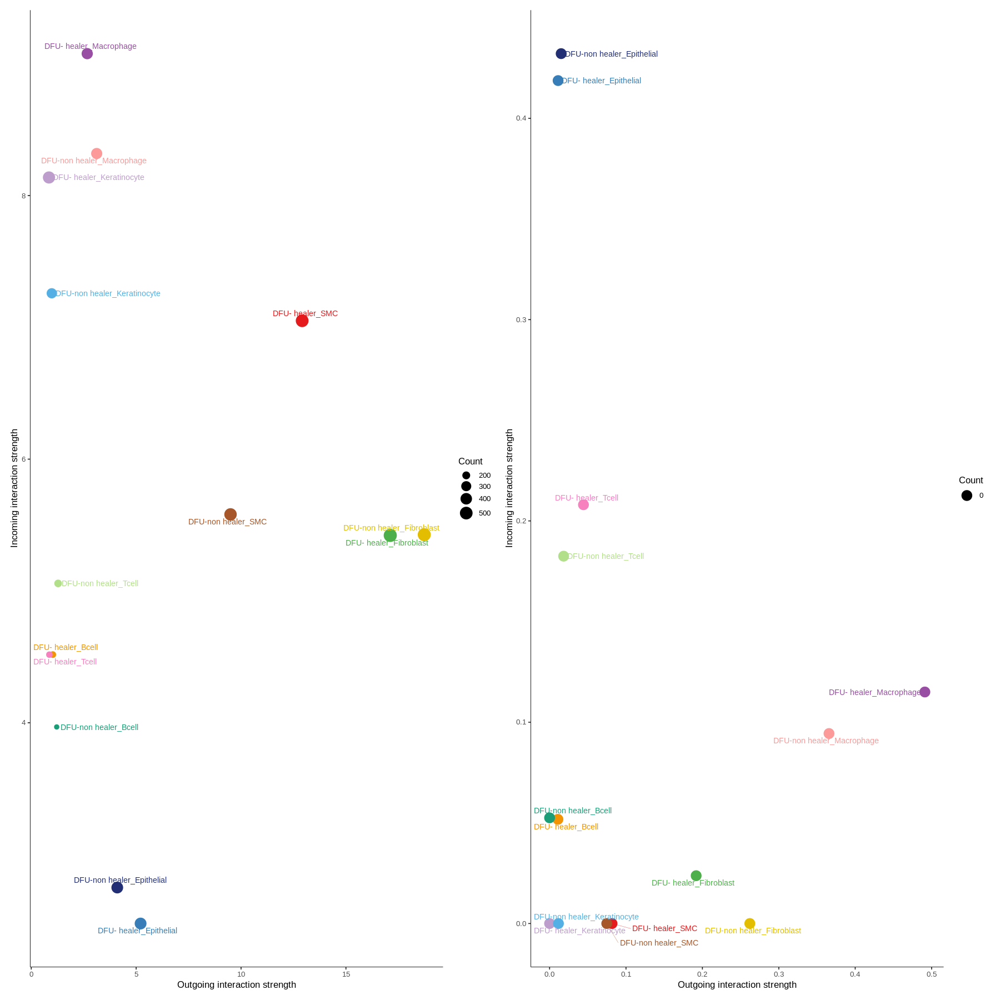

In [151]:
gg1 <- netAnalysis_signalingRole_scatter(cellchat_net)
gg2 <- netAnalysis_signalingRole_scatter(cellchat_net, signaling = c("CXCL", "CCL"))
gg1 + gg2



In [155]:
# Save the Cellchat object

In [153]:
saveRDS(cellchat_net, file = "/data2/ZenNa/DFU_Project/Result/Humandata_cellchat.rds")


In [154]:
cellchat_net

An object of class CellChat created from a single dataset 
 22114 genes.
 29319 cells. 
CellChat analysis of single cell RNA-seq data! 